# Simpson's paradox and mixed models
Author: [Benjamin T. Vincent](https://github.com/drbenvincent)

This notebook covers:
- [Simpson's Paradox](https://en.wikipedia.org/wiki/Simpson%27s_paradox) and its resolution through mixed or hierarchical models. This is a situation where there might be a negative relationship between two variables within a group, but when data from multiple groups are combined, that relationship may disappear or even reverse sign. The gif below (from the [Simpson's Paradox](https://en.wikipedia.org/wiki/Simpson%27s_paradox) Wikipedia page) demonstrates this very nicely.
- How to build linear regression models, starting with linear regression, moving up to hierarchical linear regression. Simpon's paradox is a nice motivation for why we might want to do this - but of course we should aim to build models which incorporate as much as our knowledge about the structure of the data (e.g. it's nested nature) as possible.
- Use of `pm.Data` containers to facilitate posterior prediction at different $x$ values with the same model.
- Providing array dimensions (see `coords`) to models to help with shape problems. This involves the use of [xarray](http://xarray.pydata.org/) and is quite helpful in multi-level / hierarchical models.
- Differences between posteriors and posterior predictive distributions.
- How to visualise models in data space and parameter space, using a mixture of [arvix](https://arviz-devs.github.io/arviz/) and [matplotlib](https://matplotlib.org/).

![](https://upload.wikimedia.org/wikipedia/commons/f/fb/Simpsons_paradox_-_animation.gif)

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
import xarray as xr

In [2]:
%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(1234)

## Generate data

This data generation code was influenced by this [stackexchange](https://stats.stackexchange.com/questions/479201/understanding-simpsons-paradox-with-random-effects) question.

In [3]:
def generate():
    group_list = ["one", "two", "three", "four", "five"]
    trials_per_group = 20
    group_intercepts = rng.normal(0, 1, len(group_list))
    group_slopes = np.ones(len(group_list)) * -0.5
    group_mx = group_intercepts * 2
    group = np.repeat(group_list, trials_per_group)
    subject = np.concatenate(
        [np.ones(trials_per_group) * i for i in np.arange(len(group_list))]
    ).astype(int)
    intercept = np.repeat(group_intercepts, trials_per_group)
    slope = np.repeat(group_slopes, trials_per_group)
    mx = np.repeat(group_mx, trials_per_group)
    x = rng.normal(mx, 1)
    y = rng.normal(intercept + (x - mx) * slope, 1)
    data = pd.DataFrame({"group": group, "group_idx": subject, "x": x, "y": y})
    return data, group_list


data, group_list = generate()

To follow along, it is useful to clearly understand the form of the data. This is [long form](https://en.wikipedia.org/wiki/Wide_and_narrow_data) data (also known as narrow data) in that each row represents one observation. We have a `group` column which has the group label, and an accompanying numerical `group_idx` column. This is very useful when it comes to modelling as we can use it as an index to look up group-level parameter estimates. Finally, we have our core observations of the predictor variable `x` and the outcome `y`.

In [4]:
display(data)

,group,group_idx,x,y
0,one,0,-0.294574,-2.338519
1,one,0,-4.686497,-1.448057
2,one,0,-2.262201,-1.393728
3,one,0,-4.873809,-0.265403
4,one,0,-2.863929,-0.774251
...,...,...,...,...
95,five,4,3.981413,0.467970
96,five,4,1.889102,0.553290
97,five,4,2.561267,2.590966
98,five,4,0.147378,2.050944


And we can visualise this as below.

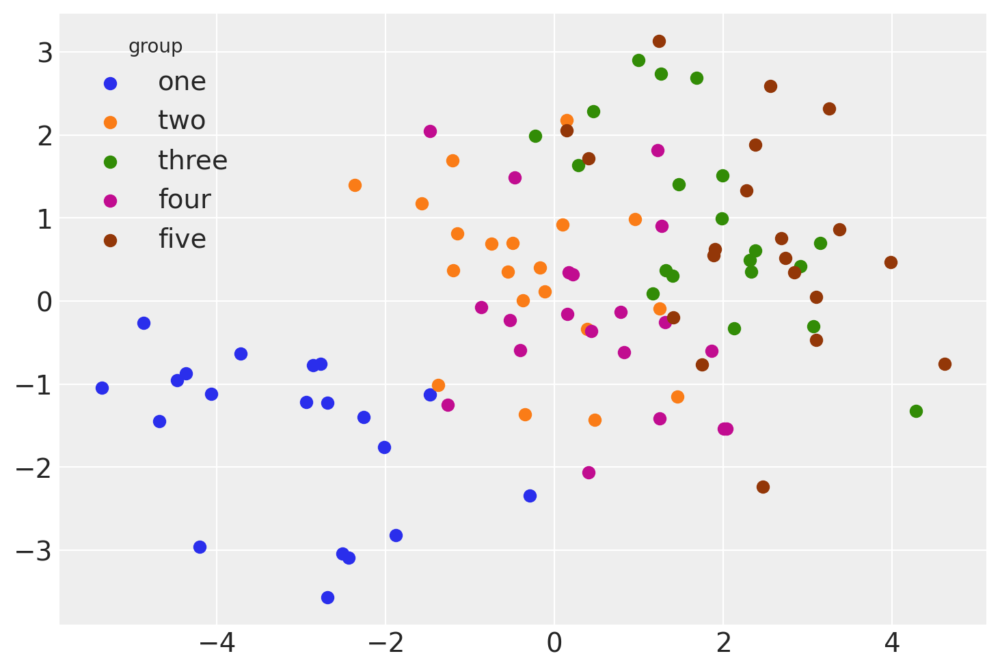

In [5]:
for i, group in enumerate(group_list):
    plt.scatter(
        data.query(f"group_idx=={i}").x,
        data.query(f"group_idx=={i}").y,
        color=f"C{i}",
        label=f"{group}",
    )
plt.legend(title="group");

The rest of the notebook will cover different ways that we can analyse this data using linear models.

## Model 1: Basic linear regression, `y ~ 1 + x`

First we examine the simplest model - plain linear regression which pools all the data and has no knowledge of the group/multi-level structure of the data.

### Build model

In [6]:
coords = {
    "group": np.sort(data.group.unique()),
    "observation": np.arange(data.shape[0]),
}

with pm.Model(coords=coords) as linear_regression:
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    β0 = pm.Normal("β0", 0, sigma=20)
    β1 = pm.Normal("β1", 0, sigma=20)
    # Data
    x = pm.Data("x", data.x)
    # Linear model
    μ = pm.Deterministic("μ", β0 + β1 * x, dims="observation")
    # Define likelihood
    pm.Normal("y", mu=μ, sigma=sigma, observed=data.y, dims="observation")

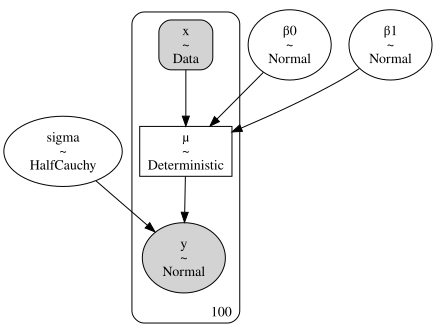

In [7]:
pm.model_to_graphviz(linear_regression)

### Do inference

In [8]:
with linear_regression:
    trace = pm.sample(tune=2000, draws=500, cores=8, return_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [β1, β0, sigma]


Sampling 8 chains for 2_000 tune and 500 draw iterations (16_000 + 4_000 draws total) took 24 seconds.


0, dim: observation, 100 =? 100


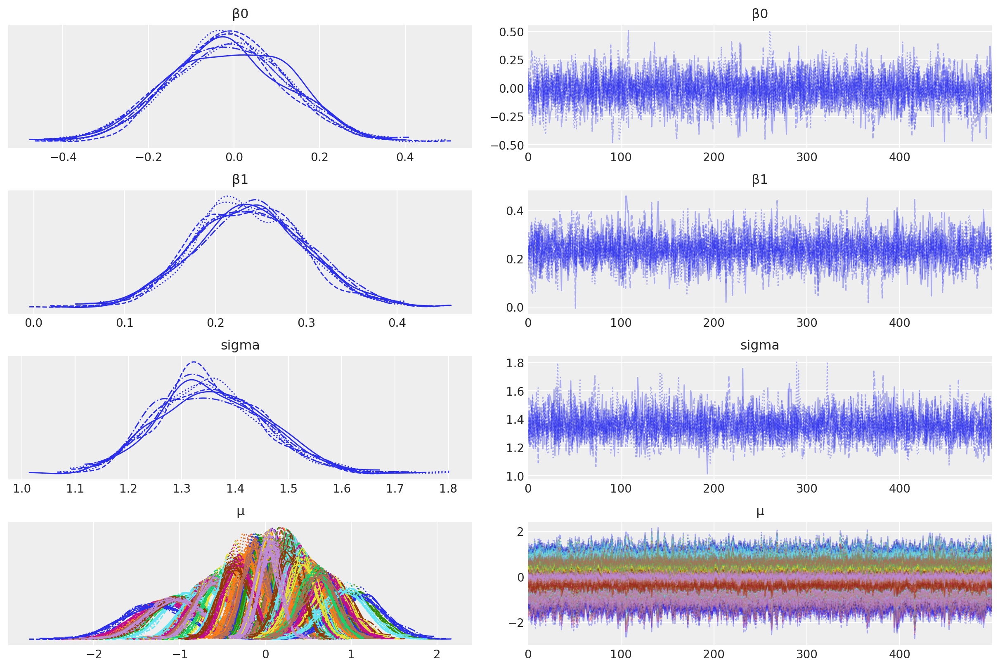

In [9]:
az.plot_trace(trace);

### Visualisation

In [10]:
# posterior prediction for these x values
xi = np.linspace(data.x.min(), data.x.max(), 20)

# do posterior predictive inference
with linear_regression:
    pm.set_data({"x": xi})
    pp_y = pm.sample_posterior_predictive(trace)["y"]

/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


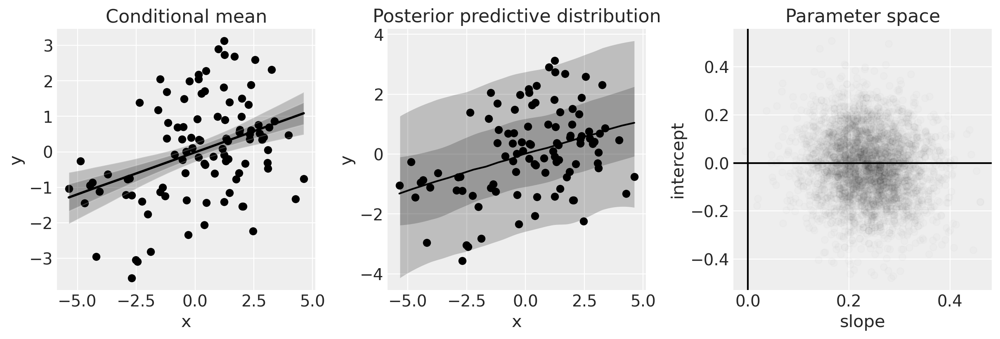

In [11]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

# conditional mean plot ---------------------------------------------
# data
ax[0].scatter(data.x, data.y, color="k")
# conditional mean credible intervals
post = trace.posterior.stack(sample=("chain", "draw"))
xi = xr.DataArray(np.linspace(np.min(data.x), np.max(data.x), 20), dims=["x_plot"])
y = post.β0 + post.β1 * xi
region = y.quantile([0.025, 0.15, 0.5, 0.85, 0.975], dim="sample")
ax[0].fill_between(
    xi, region.sel(quantile=0.025), region.sel(quantile=0.975), alpha=0.2, color="k", edgecolor="w"
)
ax[0].fill_between(
    xi, region.sel(quantile=0.15), region.sel(quantile=0.85), alpha=0.2, color="k", edgecolor="w"
)
# conditional mean
ax[0].plot(xi, region.sel(quantile=0.5), "k", linewidth=2)
# formatting
ax[0].set(xlabel="x", ylabel="y", title="Conditional mean")

# posterior prediction ----------------------------------------------
# data
ax[1].scatter(data.x, data.y, color="k")
# posterior mean and HDI's
ax[1].plot(xi, np.mean(pp_y, axis=0), "k")
az.plot_hdi(xi, pp_y, hdi_prob=0.6, color="k", fill_kwargs={"alpha": 0.2, "linewidth": 0}, ax=ax[1])
az.plot_hdi(
    xi, pp_y, hdi_prob=0.95, color="k", fill_kwargs={"alpha": 0.2, "linewidth": 0}, ax=ax[1]
)
# formatting
ax[1].set(xlabel="x", ylabel="y", title="Posterior predictive distribution")

# parameter space ---------------------------------------------------
ax[2].scatter(
    trace.posterior.β1.stack(sample=("chain", "draw")),
    trace.posterior.β0.stack(sample=("chain", "draw")),
    color="k",
    alpha=0.01,
    rasterized=True,
)

# formatting
ax[2].set(xlabel="slope", ylabel="intercept", title="Parameter space")
ax[2].axhline(y=0, c="k")
ax[2].axvline(x=0, c="k");

The plot on the left shows the data and the posterior of the **conditional mean**. For a given $x$, we get a posterior distribution of the model (i.e. of $\mu$).

The plot in the middle shows the **posterior predictive distribution**, which gives a statement about the data we expect to see. Intuitively, this can be understood as not only incorporating what we know of the model (left plot) but also what we know about the distribution of error.

The plot on the right shows out posterior beliefs in **parameter space**.

One of the clear things about this analysis is that we have credible evidence that $x$ and $y$ are _positively_ correlated. We can see this from the posterior over the slope (see right hand panel in the figure above).

## Model 2: Random slopes and intercepts model, `y ~ 0 + (1 + x | group)`

We will use the same data in this analysis, but this time we will use our knowledge that data come from groups. More specifically we will essentially fit independent regressions to data within each group.

In [12]:
coords = {"group": group_list, "observation": np.arange(data.shape[0])}  # actual group names

with pm.Model(coords=coords) as random_slope_intercept:
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10, dims="group")
    β0 = pm.Normal("β0", 0, sigma=20, dims="group")
    β1 = pm.Normal("β1", 0, sigma=20, dims="group")
    # Data
    x = pm.Data("x", data.x, dims="observation")
    g = pm.Data("g", data.group_idx, dims="observation")
    # Linear model
    μ = pm.Deterministic("μ", β0[g] + β1[g] * x, dims="observation")
    # Define likelihood
    pm.Normal("y", mu=μ, sigma=sigma[g], observed=data.y, dims="observation")

By plotting the DAG for this model it is clear to see that we now have individual intercept, slope, and variance parameters for each of the groups.

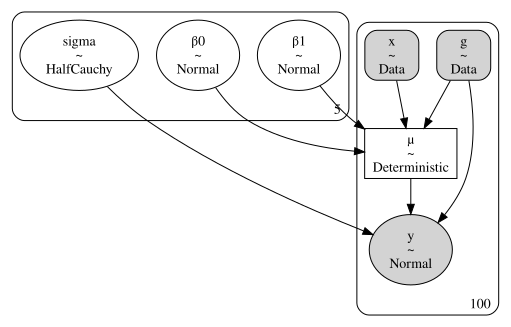

In [13]:
pm.model_to_graphviz(random_slope_intercept)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [β1, β0, sigma]


Sampling 8 chains for 2_000 tune and 500 draw iterations (16_000 + 4_000 draws total) took 28 seconds.


0, dim: observation, 100 =? 100


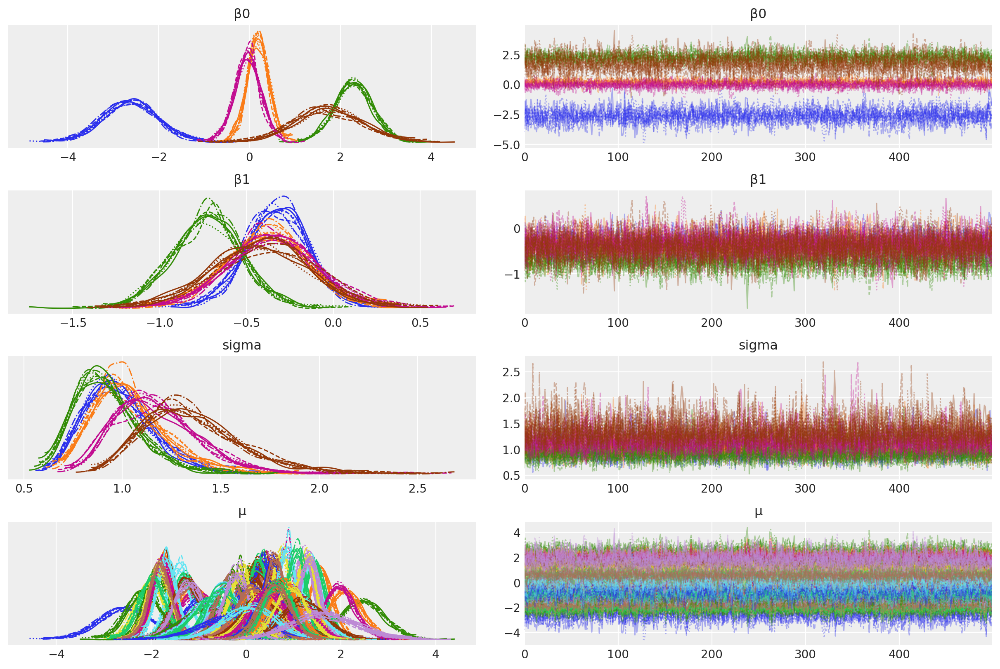

In [14]:
with random_slope_intercept:
    trace = pm.sample(tune=2000, draws=500, cores=8, return_inferencedata=True, target_accept=0.9)

az.plot_trace(trace);

### Visualisation

In [15]:
# Create values of x and g to use for posterior prediction
xi = [
    np.linspace(data.query(f"group_idx=={i}").x.min(), data.query(f"group_idx=={i}").x.max(), 10)
    for i, _ in enumerate(group_list)
]
g = [np.ones(10) * i for i, _ in enumerate(group_list)]
xi, g = np.concatenate(xi), np.concatenate(g)

# Do the posterior prediction
with random_slope_intercept:
    pm.set_data({"x": xi, "g": g.astype(int)})
    pp_y = pm.sample_posterior_predictive(trace)["y"]

/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with o

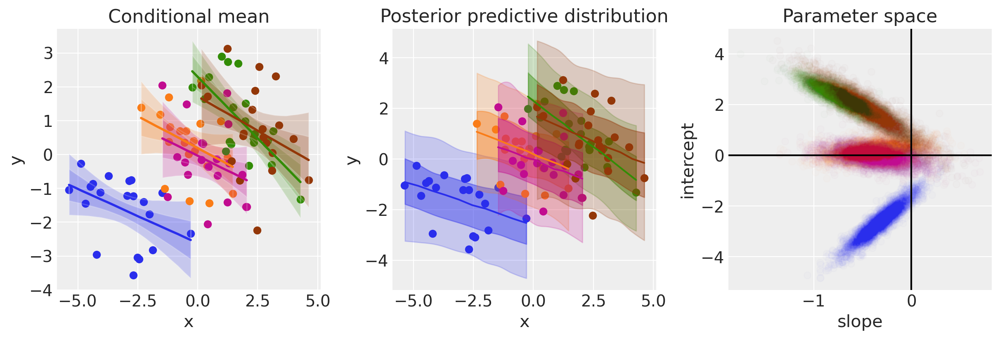

In [16]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

# conditional mean plot ---------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[0].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # conditional mean credible intervals
    post = trace.posterior.stack(sample=("chain", "draw"))
    _xi = xr.DataArray(
        np.linspace(np.min(data.x[data.group_idx == i]), np.max(data.x[data.group_idx == i]), 20),
        dims=["x_plot"],
    )
    y = post.β0.sel(group=groupname) + post.β1.sel(group=groupname) * _xi
    region = y.quantile([0.025, 0.15, 0.5, 0.85, 0.975], dim="sample")
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.025),
        region.sel(quantile=0.975),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.15),
        region.sel(quantile=0.85),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    # conditional mean
    ax[0].plot(_xi, region.sel(quantile=0.5), color=f"C{i}", linewidth=2)
    # formatting
    ax[0].set(xlabel="x", ylabel="y", title="Conditional mean")

# posterior prediction ----------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[1].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # posterior mean and HDI's
    ax[1].plot(xi[g == i], np.mean(pp_y[:, g == i], axis=0), label=groupname)
    az.plot_hdi(
        xi[g == i],
        pp_y[:, g == i],
        hdi_prob=0.6,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.4},
        ax=ax[1],
    )
    az.plot_hdi(
        xi[g == i],
        pp_y[:, g == i],
        hdi_prob=0.95,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.2},
        ax=ax[1],
    )

ax[1].set(xlabel="x", ylabel="y", title="Posterior predictive distribution")


# parameter space ---------------------------------------------------
for i, _ in enumerate(group_list):
    ax[2].scatter(
        trace.posterior.β1.stack(sample=("chain", "draw"))[i, :],
        trace.posterior.β0.stack(sample=("chain", "draw"))[i, :],
        color=f"C{i}",
        alpha=0.01,
        rasterized=True,
    )

ax[2].set(xlabel="slope", ylabel="intercept", title="Parameter space")
ax[2].axhline(y=0, c="k")
ax[2].axvline(x=0, c="k")

In contrast to plain regression model (Model 1), when we model on the group level we can see that now the evidence points toward _negative_ relationships between $x$ and $y$. 

## Model 3: Hierarchical regression, `y ~ 1 + x + (1 + x | group) ???`
We can go beyond Model 2 and incorporate even more knowledge about the structure of our data. Rather than treating each group as entirely independent, we can use our knowledge that these groups are drawn from a population-level distribution. These are sometimes called hyper-parameters. 

In one sense this move from Model 2 to Model 3 can be seen as adding parameters, and therefore increasing model complexity. However, in another sense, adding this knowledge about the nested structure of the data actually provides a constraint over parameter space.

Note: This model was producing divergent samples, so a reparameterisation trick is used. See the blog post [Why hierarchical models are awesome, tricky, and Bayesian](https://twiecki.io/blog/2017/02/08/bayesian-hierchical-non-centered/) by Thomas Wiecki for more information on this.

In [17]:
coords = {
    "group": group_list,  # actual group names
    "observation": np.arange(data.shape[0]),  # or use this, `data.index.values`
}

with pm.Model(coords=coords) as hierarchical:
    # Hyperpriors
    intercept_mu = pm.Normal("intercept_mu", 0, sigma=1)
    intercept_sigma = pm.HalfCauchy("intercept_sigma", beta=2)
    slope_mu = pm.Normal("slope_mu", 0, sigma=1)
    slope_sigma = pm.HalfCauchy("slope_sigma", beta=2)

    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10, dims="group")

    # Reparameterise to avoid chain divergences
    # β0 = pm.Normal("β0", intercept_mu, sigma=intercept_sigma, dims="group")
    β0_offset = pm.Normal("β0_offset", 0, sigma=1, dims="group")
    β0 = pm.Deterministic("β0", intercept_mu + β0_offset * intercept_sigma, dims="group")

    # Reparameterise to avoid chain divergences
    # β1 = pm.Normal("β1", slope_mu, sigma=slope_sigma, dims="group")
    β1_offset = pm.Normal("β1_offset", 0, sigma=1, dims="group")
    β1 = pm.Deterministic("β1", slope_mu + β1_offset * slope_sigma, dims="group")

    # Data
    x = pm.Data("x", data.x, dims="observation")
    g = pm.Data("g", data.group_idx, dims="observation")
    # Linear model
    μ = pm.Deterministic("μ", β0[g] + β1[g] * x, dims="observation")
    # Define likelihood
    pm.Normal("y", mu=μ, sigma=sigma[g], observed=data.y, dims="observation")

Plotting the DAG now makes it clear that the group-level intercept and slope parameters are drawn from a population level distributions. That is, we have hyper-priors for the slopes and intercept parameters. This particular model does not have a hyper-prior for the measurement error - this is just left as one parameter per group, as in the previous model.

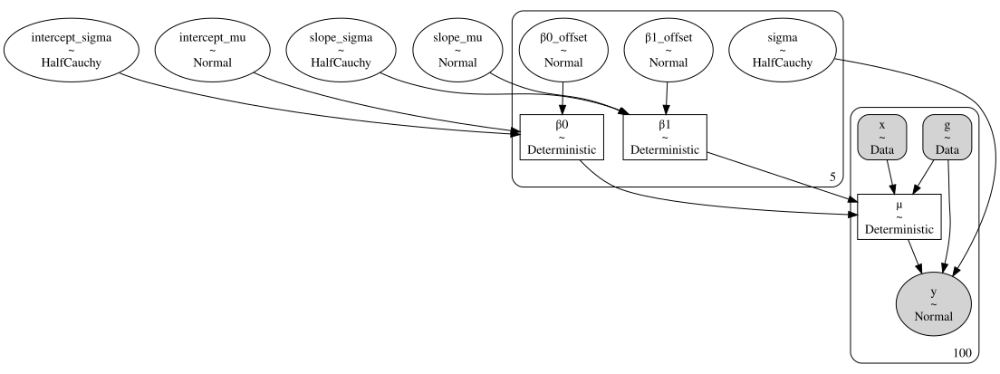

In [18]:
pm.model_to_graphviz(hierarchical)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [β1_offset, β0_offset, sigma, slope_sigma, slope_mu, intercept_sigma, intercept_mu]


Sampling 8 chains for 2_000 tune and 500 draw iterations (16_000 + 4_000 draws total) took 54 seconds.


0, dim: observation, 100 =? 100


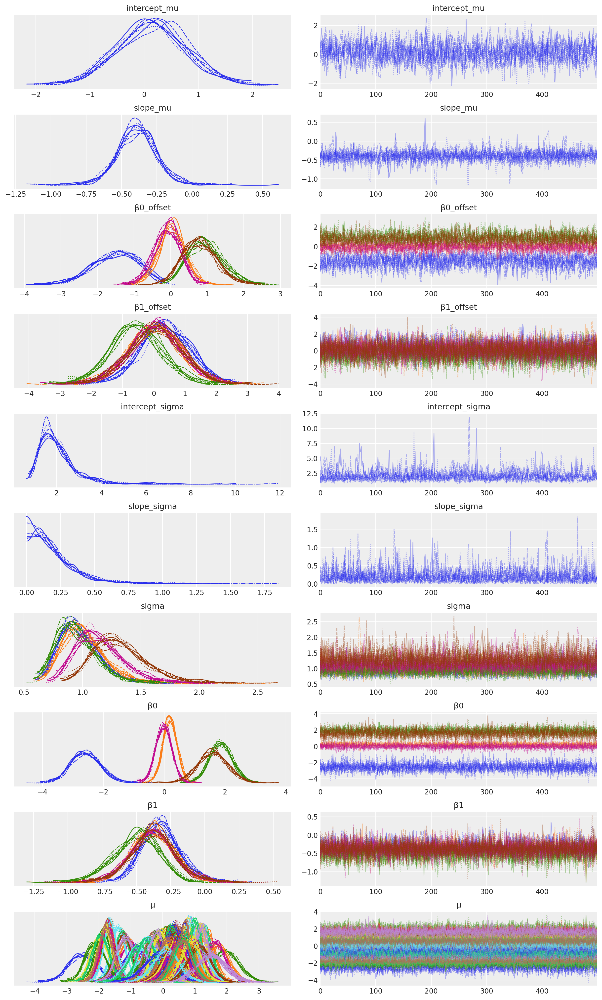

In [19]:
with hierarchical:
    trace = pm.sample(tune=2000, draws=500, cores=8, return_inferencedata=True, target_accept=0.98)

az.plot_trace(trace);

### Visualise

In [20]:
# Create values of x and g to use for posterior prediction
xi = [
    np.linspace(data.query(f"group_idx=={i}").x.min(), data.query(f"group_idx=={i}").x.max(), 10)
    for i, _ in enumerate(group_list)
]
g = [np.ones(10) * i for i, _ in enumerate(group_list)]
xi, g = np.concatenate(xi), np.concatenate(g)

# Do the posterior prediction
with hierarchical:
    pm.set_data({"x": xi, "g": g.astype(int)})
    pp_y = pm.sample_posterior_predictive(trace)["y"]

/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/benjamv/opt/anaconda3/lib/python3.8/site-packages/arviz/stats/stats.py:493: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with o

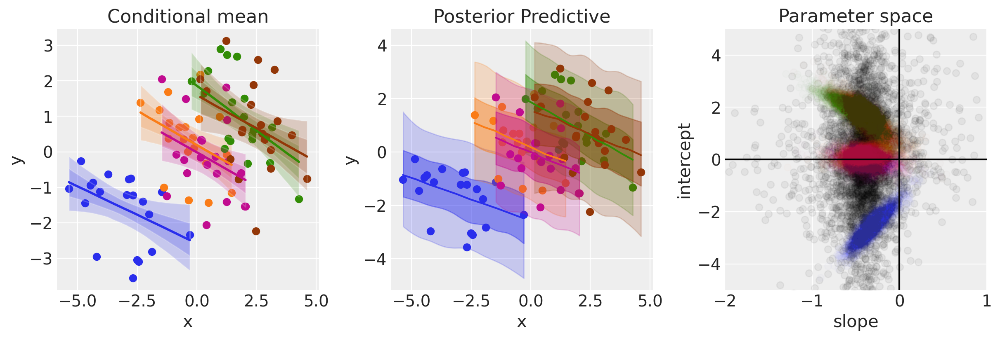

In [21]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

# conditional mean plot ---------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[0].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # conditional mean credible intervals
    post = trace.posterior.stack(sample=("chain", "draw"))
    _xi = xr.DataArray(
        np.linspace(np.min(data.x[data.group_idx == i]), np.max(data.x[data.group_idx == i]), 20),
        dims=["x_plot"],
    )
    y = post.β0.sel(group=groupname) + post.β1.sel(group=groupname) * _xi
    region = y.quantile([0.025, 0.15, 0.5, 0.85, 0.975], dim="sample")
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.025),
        region.sel(quantile=0.975),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.15),
        region.sel(quantile=0.85),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    # conditional mean
    ax[0].plot(_xi, region.sel(quantile=0.5), color=f"C{i}", linewidth=2)
    # formatting
    ax[0].set(xlabel="x", ylabel="y", title="Conditional mean")

# posterior prediction ----------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[1].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # posterior mean and HDI's
    ax[1].plot(xi[g == i], np.mean(pp_y[:, g == i], axis=0), label=groupname)
    az.plot_hdi(
        xi[g == i],
        pp_y[:, g == i],
        hdi_prob=0.6,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.4},
        ax=ax[1],
    )
    az.plot_hdi(
        xi[g == i],
        pp_y[:, g == i],
        hdi_prob=0.95,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.2},
        ax=ax[1],
    )

ax[1].set(xlabel="x", ylabel="y", title="Posterior Predictive")

# parameter space ---------------------------------------------------
# plot posterior for population level slope and intercept
slope = rng.normal(
    trace.posterior.slope_mu.stack(sample=("chain", "draw")).values,
    trace.posterior.slope_sigma.stack(sample=("chain", "draw")).values,
)
intercept = rng.normal(
    trace.posterior.intercept_mu.stack(sample=("chain", "draw")).values,
    trace.posterior.intercept_sigma.stack(sample=("chain", "draw")).values,
)
ax[2].scatter(slope, intercept, color="k", alpha=0.05)
# plot posterior for group level slope and intercept
for i, _ in enumerate(group_list):
    ax[2].scatter(
        trace.posterior.β1.stack(sample=("chain", "draw"))[i, :],
        trace.posterior.β0.stack(sample=("chain", "draw"))[i, :],
        color=f"C{i}",
        alpha=0.01,
    )

ax[2].set(xlabel="slope", ylabel="intercept", title="Parameter space", xlim=[-2, 1], ylim=[-5, 5])
ax[2].axhline(y=0, c="k")
ax[2].axvline(x=0, c="k")

The panel on the right shows the posterior group level posterior of the slope and intercept parameters in black. This particular visualisation is a little unclear however, so we can just plot the marginal distribution below to see how much belief we have in the slope being less than zero.

Text(0.5, 1.0, 'Group level slope parameter')

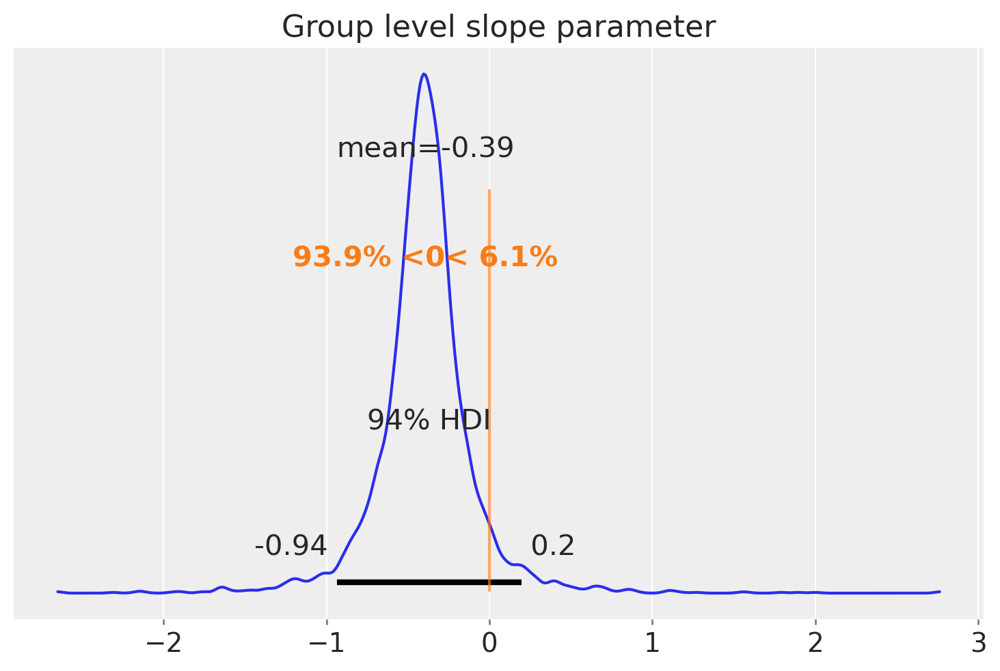

In [22]:
az.plot_posterior(slope, ref_val=0)
plt.title("Group level slope parameter")

In [23]:
%load_ext watermark
%watermark -n -u -v -iv -w -p theano,xarray

Last updated: Sat Jun 19 2021

Python implementation: CPython
Python version       : 3.8.5
IPython version      : 7.20.0

theano: 1.1.2
xarray: 0.16.2

pymc3     : 3.11.1
arviz     : 0.11.0
matplotlib: 3.3.2
numpy     : 1.19.2
xarray    : 0.16.2
pandas    : 1.2.1

Watermark: 2.1.0

